Dataset : 02_student_Mental Health

In [ ]:
# importing libraries
import pandas as pd
import scipy
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
# Load the dataset
df = pd.read_csv('/content/02_Student_Mental_Health_2021-10-10-2.csv')
df.head()


,StartDate,EndDate,Duration (in seconds),Eligibility,Age,Ethnicity,Ethnicity_text,Sex,Gender,Year_credits,...,Post_PSS_1,Post_PSS_2,Post_PSS_3,Post_PSS_4,Post_PSS_5,Post_PSS_6,Post_PSS_7,Post_PSS_8,Post_PSS_9,Post_PSS_10
0,9/22/20 13:57,9/22/20 14:05,461,1,18,2,NaN,2,2,1,...,4,3,3,1,3,3,2,3,3,3
1,9/22/20 14:16,9/22/20 14:36,1215,1,18,1,NaN,2,2,1,...,5,4,3,4,2,2,3,4,3,2
2,9/22/20 14:59,9/22/20 15:07,526,1,18,2,NaN,2,2,1,...,2,3,4,3,4,4,2,3,4,4
3,9/22/20 16:07,9/22/20 16:15,516,1,19,1,NaN,2,2,1,...,4,4,5,4,2,4,3,3,4,3
4,9/22/20 17:15,9/22/20 18:01,2751,1,18,1,NaN,2,2,1,...,2,1,5,4,3,3,4,3,5,3


In [ ]:
df.isnull().sum()

StartDate                   0
EndDate                     0
Duration (in seconds)       0
Eligibility                 0
Age                         0
Ethnicity                   0
Ethnicity_text           1102
Sex                         0
Gender                      0
Year_credits                0
Year_calendar               0
Program                     0
Part_time                   0
Degree                      0
Disability                  0
Living                      0
Province                    0
International               0
Employment                  0
Volunteering                0
Plans                       0
Catch_question            444
Hobbies_Imp_1               0
Hobbies_Imp_2               0
Hobbies_Imp_3               0
Hobbies_Imp_4               0
Hobbies_Imp_5               0
Hobbies_Imp_6               0
Hobbies_Imp_7               0
Hobbies_Imp_8               0
Hobbies_Time_1              0
Hobbies_Time_2              0
Hobbies_Time_3              0
Hobbies_Ti

In [ ]:
df.describe()


,Duration (in seconds),Eligibility,Age,Ethnicity,Sex,Gender,Year_credits,Year_calendar,Program,Part_time,...,Post_PSS_1,Post_PSS_2,Post_PSS_3,Post_PSS_4,Post_PSS_5,Post_PSS_6,Post_PSS_7,Post_PSS_8,Post_PSS_9,Post_PSS_10
count,1192.000000,1192.0,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,...,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000
mean,2782.581376,1.0,20.250839,1.838926,1.809564,1.842282,2.440436,2.718121,5.944631,1.963087,...,3.231544,3.493289,3.901846,3.057047,2.693792,3.445470,2.973154,2.735738,3.278523,3.505872
std,30869.181394,0.0,2.953886,1.535221,0.392810,0.594086,1.171940,1.458433,2.283505,0.188627,...,1.084233,1.100319,1.054961,0.995422,0.962449,1.120924,0.943020,0.993580,1.175431,1.141522
min,241.000000,1.0,16.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,658.000000,1.0,19.000000,1.000000,2.000000,2.000000,1.000000,2.000000,5.000000,2.000000,...,3.000000,3.000000,3.000000,2.000000,2.000000,3.000000,2.000000,2.000000,2.000000,3.000000
50%,807.500000,1.0,20.000000,1.000000,2.000000,2.000000,2.000000,3.000000,7.000000,2.000000,...,3.000000,4.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000
75%,1042.250000,1.0,21.000000,2.000000,2.000000,2.000000,3.000000,4.000000,7.000000,2.000000,...,4.000000,4.000000,5.000000,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,4.000000
max,727343.000000,1.0,58.000000,7.000000,2.000000,12.000000,5.000000,8.000000,8.000000,2.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [ ]:
df_new=df
columns_to_normalize_indices = list(range(56, 68))

# Select the columns to normalize
columns_to_normalize = df.iloc[:, columns_to_normalize_indices]

# Create the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the selected columns
normalized_columns = scaler.fit_transform(columns_to_normalize)

# Replace the original columns with the normalized values
df_new.iloc[:, columns_to_normalize_indices] = normalized_columns
# Create a new column with the row-wise average without dropping the columns
df_new['SSS'] = df_new.iloc[:, columns_to_normalize_indices].mean(axis=1)
df_new


,StartDate,EndDate,Duration (in seconds),Eligibility,Age,Ethnicity,Ethnicity_text,Sex,Gender,Year_credits,...,Post_PSS_2,Post_PSS_3,Post_PSS_4,Post_PSS_5,Post_PSS_6,Post_PSS_7,Post_PSS_8,Post_PSS_9,Post_PSS_10,SSS
0,9/22/20 13:57,9/22/20 14:05,461,1,18,2,NaN,2,2,1,...,3,3,1,3,3,2,3,3,3,0.486111
1,9/22/20 14:16,9/22/20 14:36,1215,1,18,1,NaN,2,2,1,...,4,3,4,2,2,3,4,3,2,0.694444
2,9/22/20 14:59,9/22/20 15:07,526,1,18,2,NaN,2,2,1,...,3,4,3,4,4,2,3,4,4,0.423611
3,9/22/20 16:07,9/22/20 16:15,516,1,19,1,NaN,2,2,1,...,4,5,4,2,4,3,3,4,3,0.618056
4,9/22/20 17:15,9/22/20 18:01,2751,1,18,1,NaN,2,2,1,...,1,5,4,3,3,4,3,5,3,0.500000
5,9/22/20 18:45,9/22/20 18:59,824,1,17,2,NaN,2,2,1,...,2,2,4,4,3,3,3,3,4,0.465278
6,9/22/20 21:00,9/23/20 0:14,11663,1,17,2,NaN,1,1,1,...,4,5,3,2,5,2,2,5,5,0.694444
7,9/22/20 21:14,9/22/20 21:31,1035,1,18,2,NaN,1,1,1,...,2,2,4,3,4,4,2,1,5,0.381944
8,9/23/20 0:30,9/23/20 0:45,925,1,18,5,NaN,1,1,1,...,3,2,4,4,2,4,4,3,2,0.569444
9,9/23/20 9:56,9/23/20 10:08,679,1,18,2,NaN,2,2,1,...,5,5,3,2,4,3,3,4,4,0.715278


In [ ]:

columns_to_normalize_indices = list(range(81, 96))

# Select the columns to normalize
columns_to_normalize = df.iloc[:, columns_to_normalize_indices]

# Create the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the selected columns
normalized_columns = scaler.fit_transform(columns_to_normalize)

# Replace the original columns with the normalized values
df_new.iloc[:, columns_to_normalize_indices] = normalized_columns
# Create a new column with the row-wise average without dropping the columns
df_new['DERS'] = df.iloc[:, columns_to_normalize_indices].mean(axis=1)
df_new

,StartDate,EndDate,Duration (in seconds),Eligibility,Age,Ethnicity,Ethnicity_text,Sex,Gender,Year_credits,...,Post_PSS_3,Post_PSS_4,Post_PSS_5,Post_PSS_6,Post_PSS_7,Post_PSS_8,Post_PSS_9,Post_PSS_10,SSS,DERS
0,9/22/20 13:57,9/22/20 14:05,461,1,18,2,NaN,2,2,1,...,3,1,3,3,2,3,3,3,0.486111,0.750000
1,9/22/20 14:16,9/22/20 14:36,1215,1,18,1,NaN,2,2,1,...,3,4,2,2,3,4,3,2,0.694444,0.366667
2,9/22/20 14:59,9/22/20 15:07,526,1,18,2,NaN,2,2,1,...,4,3,4,4,2,3,4,4,0.423611,0.883333
3,9/22/20 16:07,9/22/20 16:15,516,1,19,1,NaN,2,2,1,...,5,4,2,4,3,3,4,3,0.618056,0.700000
4,9/22/20 17:15,9/22/20 18:01,2751,1,18,1,NaN,2,2,1,...,5,4,3,3,4,3,5,3,0.500000,0.450000
5,9/22/20 18:45,9/22/20 18:59,824,1,17,2,NaN,2,2,1,...,2,4,4,3,3,3,3,4,0.465278,0.433333
6,9/22/20 21:00,9/23/20 0:14,11663,1,17,2,NaN,1,1,1,...,5,3,2,5,2,2,5,5,0.694444,0.766667
7,9/22/20 21:14,9/22/20 21:31,1035,1,18,2,NaN,1,1,1,...,2,4,3,4,4,2,1,5,0.381944,0.250000
8,9/23/20 0:30,9/23/20 0:45,925,1,18,5,NaN,1,1,1,...,2,4,4,2,4,4,3,2,0.569444,0.183333
9,9/23/20 9:56,9/23/20 10:08,679,1,18,2,NaN,2,2,1,...,5,3,2,4,3,3,4,4,0.715278,0.766667


In [ ]:

columns_to_normalize_indices = list(range(97,117))

# Select the columns to normalize
columns_to_normalize = df.iloc[:, columns_to_normalize_indices]

# Create the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the selected columns
normalized_columns = scaler.fit_transform(columns_to_normalize)

# Replace the original columns with the normalized values
df_new.iloc[:, columns_to_normalize_indices] = normalized_columns
# Create a new column with the row-wise average without dropping the columns
df_new['DASS'] = df_new.iloc[:, columns_to_normalize_indices].mean(axis=1)
df_new

,StartDate,EndDate,Duration (in seconds),Eligibility,Age,Ethnicity,Ethnicity_text,Sex,Gender,Year_credits,...,Post_PSS_4,Post_PSS_5,Post_PSS_6,Post_PSS_7,Post_PSS_8,Post_PSS_9,Post_PSS_10,SSS,DERS,DASS
0,9/22/20 13:57,9/22/20 14:05,461,1,18,2,NaN,2,2,1,...,1,3,3,2,3,3,3,0.486111,0.750000,0.466667
1,9/22/20 14:16,9/22/20 14:36,1215,1,18,1,NaN,2,2,1,...,4,2,2,3,4,3,2,0.694444,0.366667,0.433333
2,9/22/20 14:59,9/22/20 15:07,526,1,18,2,NaN,2,2,1,...,3,4,4,2,3,4,4,0.423611,0.883333,0.733333
3,9/22/20 16:07,9/22/20 16:15,516,1,19,1,NaN,2,2,1,...,4,2,4,3,3,4,3,0.618056,0.700000,0.233333
4,9/22/20 17:15,9/22/20 18:01,2751,1,18,1,NaN,2,2,1,...,4,3,3,4,3,5,3,0.500000,0.450000,0.333333
5,9/22/20 18:45,9/22/20 18:59,824,1,17,2,NaN,2,2,1,...,4,4,3,3,3,3,4,0.465278,0.433333,0.350000
6,9/22/20 21:00,9/23/20 0:14,11663,1,17,2,NaN,1,1,1,...,3,2,5,2,2,5,5,0.694444,0.766667,0.550000
7,9/22/20 21:14,9/22/20 21:31,1035,1,18,2,NaN,1,1,1,...,4,3,4,4,2,1,5,0.381944,0.250000,0.200000
8,9/23/20 0:30,9/23/20 0:45,925,1,18,5,NaN,1,1,1,...,4,4,2,4,4,3,2,0.569444,0.183333,0.183333
9,9/23/20 9:56,9/23/20 10:08,679,1,18,2,NaN,2,2,1,...,3,2,4,3,3,4,4,0.715278,0.766667,0.616667


In [ ]:

columns_to_normalize_indices = list(range(124,133))

# Select the columns to normalize
columns_to_normalize = df.iloc[:, columns_to_normalize_indices]

# Create the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the selected columns
normalized_columns = scaler.fit_transform(columns_to_normalize)

# Replace the original columns with the normalized values
df_new.iloc[:, columns_to_normalize_indices] = normalized_columns
# Create a new column with the row-wise average without dropping the columns
df_new['PRE_PSS'] = df_new.iloc[:, columns_to_normalize_indices].mean(axis=1)
df_new

,StartDate,EndDate,Duration (in seconds),Eligibility,Age,Ethnicity,Ethnicity_text,Sex,Gender,Year_credits,...,Post_PSS_5,Post_PSS_6,Post_PSS_7,Post_PSS_8,Post_PSS_9,Post_PSS_10,SSS,DERS,DASS,PRE_PSS
0,9/22/20 13:57,9/22/20 14:05,461,1,18,2,NaN,2,2,1,...,3,3,2,3,3,3,0.486111,0.750000,0.466667,0.500000
1,9/22/20 14:16,9/22/20 14:36,1215,1,18,1,NaN,2,2,1,...,2,2,3,4,3,2,0.694444,0.366667,0.433333,0.611111
2,9/22/20 14:59,9/22/20 15:07,526,1,18,2,NaN,2,2,1,...,4,4,2,3,4,4,0.423611,0.883333,0.733333,0.555556
3,9/22/20 16:07,9/22/20 16:15,516,1,19,1,NaN,2,2,1,...,2,4,3,3,4,3,0.618056,0.700000,0.233333,0.555556
4,9/22/20 17:15,9/22/20 18:01,2751,1,18,1,NaN,2,2,1,...,3,3,4,3,5,3,0.500000,0.450000,0.333333,0.527778
5,9/22/20 18:45,9/22/20 18:59,824,1,17,2,NaN,2,2,1,...,4,3,3,3,3,4,0.465278,0.433333,0.350000,0.500000
6,9/22/20 21:00,9/23/20 0:14,11663,1,17,2,NaN,1,1,1,...,2,5,2,2,5,5,0.694444,0.766667,0.550000,0.666667
7,9/22/20 21:14,9/22/20 21:31,1035,1,18,2,NaN,1,1,1,...,3,4,4,2,1,5,0.381944,0.250000,0.200000,0.583333
8,9/23/20 0:30,9/23/20 0:45,925,1,18,5,NaN,1,1,1,...,4,2,4,4,3,2,0.569444,0.183333,0.183333,0.583333
9,9/23/20 9:56,9/23/20 10:08,679,1,18,2,NaN,2,2,1,...,2,4,3,3,4,4,0.715278,0.766667,0.616667,0.611111


In [ ]:

columns_to_normalize_indices = list(range(138,147))

# Select the columns to normalize
columns_to_normalize = df.iloc[:, columns_to_normalize_indices]

# Create the MinMaxScaler
scaler = MinMaxScaler()

# Fit and transform the selected columns
normalized_columns = scaler.fit_transform(columns_to_normalize)

# Replace the original columns with the normalized values
df_new.iloc[:, columns_to_normalize_indices] = normalized_columns
# Create a new column with the row-wise average without dropping the columns
df_new['Post_PSS'] = df_new.iloc[:, columns_to_normalize_indices].mean(axis=1)
df_new

,StartDate,EndDate,Duration (in seconds),Eligibility,Age,Ethnicity,Ethnicity_text,Sex,Gender,Year_credits,...,Post_PSS_6,Post_PSS_7,Post_PSS_8,Post_PSS_9,Post_PSS_10,SSS,DERS,DASS,PRE_PSS,Post_PSS
0,9/22/20 13:57,9/22/20 14:05,461,1,18,2,NaN,2,2,1,...,0.50,0.25,0.50,0.50,0.50,0.486111,0.750000,0.466667,0.500000,0.416667
1,9/22/20 14:16,9/22/20 14:36,1215,1,18,1,NaN,2,2,1,...,0.25,0.50,0.75,0.50,0.25,0.694444,0.366667,0.433333,0.611111,0.500000
2,9/22/20 14:59,9/22/20 15:07,526,1,18,2,NaN,2,2,1,...,0.75,0.25,0.50,0.75,0.75,0.423611,0.883333,0.733333,0.555556,0.611111
3,9/22/20 16:07,9/22/20 16:15,516,1,19,1,NaN,2,2,1,...,0.75,0.50,0.50,0.75,0.50,0.618056,0.700000,0.233333,0.555556,0.638889
4,9/22/20 17:15,9/22/20 18:01,2751,1,18,1,NaN,2,2,1,...,0.50,0.75,0.50,1.00,0.50,0.500000,0.450000,0.333333,0.527778,0.611111
5,9/22/20 18:45,9/22/20 18:59,824,1,17,2,NaN,2,2,1,...,0.50,0.50,0.50,0.50,0.75,0.465278,0.433333,0.350000,0.500000,0.527778
6,9/22/20 21:00,9/23/20 0:14,11663,1,17,2,NaN,1,1,1,...,1.00,0.25,0.25,1.00,1.00,0.694444,0.766667,0.550000,0.666667,0.666667
7,9/22/20 21:14,9/22/20 21:31,1035,1,18,2,NaN,1,1,1,...,0.75,0.75,0.25,0.00,1.00,0.381944,0.250000,0.200000,0.583333,0.500000
8,9/23/20 0:30,9/23/20 0:45,925,1,18,5,NaN,1,1,1,...,0.25,0.75,0.75,0.50,0.25,0.569444,0.183333,0.183333,0.583333,0.527778
9,9/23/20 9:56,9/23/20 10:08,679,1,18,2,NaN,2,2,1,...,0.75,0.50,0.50,0.75,0.75,0.715278,0.766667,0.616667,0.611111,0.666667


In [ ]:
# Define multiple ranges of columns to drop
columns_to_drop_indices = [
    list(range(57, 68)),
    list(range(124, 133)),
    list(range(138, 147)) ,
     list(range(68,71 )),
     list(range(118,123 )),
      list(range(134,137 )),
]

# Flatten the list of lists to get a single list of columns to drop
columns_to_drop = [col for sublist in columns_to_drop_indices for col in sublist]

# Drop the specified columns
df = df.drop(columns=df.columns[columns_to_drop])
df

,StartDate,EndDate,Duration (in seconds),Eligibility,Age,Ethnicity,Ethnicity_text,Sex,Gender,Year_credits,...,DASS_21,Diagnosis,Pre_PSS_1,Post_GAD_1,Post_PSS_1,SSS,DERS,DASS,PRE_PSS,Post_PSS
0,9/22/20 13:57,9/22/20 14:05,461,1,18,2,NaN,2,2,1,...,0.333333,2,3,2,4,0.486111,0.750000,0.466667,0.500000,0.416667
1,9/22/20 14:16,9/22/20 14:36,1215,1,18,1,NaN,2,2,1,...,0.000000,1,3,4,5,0.694444,0.366667,0.433333,0.611111,0.500000
2,9/22/20 14:59,9/22/20 15:07,526,1,18,2,NaN,2,2,1,...,1.000000,1,3,4,2,0.423611,0.883333,0.733333,0.555556,0.611111
3,9/22/20 16:07,9/22/20 16:15,516,1,19,1,NaN,2,2,1,...,0.333333,1,3,4,4,0.618056,0.700000,0.233333,0.555556,0.638889
4,9/22/20 17:15,9/22/20 18:01,2751,1,18,1,NaN,2,2,1,...,0.000000,1,2,4,2,0.500000,0.450000,0.333333,0.527778,0.611111
5,9/22/20 18:45,9/22/20 18:59,824,1,17,2,NaN,2,2,1,...,0.000000,2,2,1,2,0.465278,0.433333,0.350000,0.500000,0.527778
6,9/22/20 21:00,9/23/20 0:14,11663,1,17,2,NaN,1,1,1,...,0.000000,2,5,3,5,0.694444,0.766667,0.550000,0.666667,0.666667
7,9/22/20 21:14,9/22/20 21:31,1035,1,18,2,NaN,1,1,1,...,0.000000,2,3,1,1,0.381944,0.250000,0.200000,0.583333,0.500000
8,9/23/20 0:30,9/23/20 0:45,925,1,18,5,NaN,1,1,1,...,0.333333,2,3,2,3,0.569444,0.183333,0.183333,0.583333,0.527778
9,9/23/20 9:56,9/23/20 10:08,679,1,18,2,NaN,2,2,1,...,1.000000,2,4,4,3,0.715278,0.766667,0.616667,0.611111,0.666667


In [ ]:

columns_to_drop = ['StartDate','EndDate','Duration (in seconds)','Eligibility','Ethnicity_text','Sex','Year_calendar','Catch_question','Hobbies_Imp_4','Hobbies_Imp_5','Hobbies_Imp_6','Hobbies_Imp_7','Hobbies_Imp_8','Hobbies_Time_4','Hobbies_Time_5','Hobbies_Time_6','Hobbies_Time_7','Hobbies_Time_8','CATS_1','CATS_2','CATS_3','CATS_4','CATS_5','CATS_6','CATS_7','CATS_8','CATS_9','CATS_10','Ethnicity',]
for element in columns_to_drop:
  df = df.drop(columns=element)

df


,Age,Gender,Year_credits,Program,Part_time,Degree,Disability,Living,Province,International,...,DASS_21,Diagnosis,Pre_PSS_1,Post_GAD_1,Post_PSS_1,SSS,DERS,DASS,PRE_PSS,Post_PSS
0,18,2,1,7,2,1,2,2,5,2,...,0.333333,2,3,2,4,0.486111,0.750000,0.466667,0.500000,0.416667
1,18,2,1,8,2,1,2,1,1,2,...,0.000000,1,3,4,5,0.694444,0.366667,0.433333,0.611111,0.500000
2,18,2,1,2,2,1,2,2,5,2,...,1.000000,1,3,4,2,0.423611,0.883333,0.733333,0.555556,0.611111
3,19,2,1,3,2,1,2,4,2,2,...,0.333333,1,3,4,4,0.618056,0.700000,0.233333,0.555556,0.638889
4,18,2,1,3,2,1,1,4,1,2,...,0.000000,1,2,4,2,0.500000,0.450000,0.333333,0.527778,0.611111
5,17,2,1,1,2,1,2,2,5,2,...,0.000000,2,2,1,2,0.465278,0.433333,0.350000,0.500000,0.527778
6,17,1,1,3,2,1,2,2,1,1,...,0.000000,2,5,3,5,0.694444,0.766667,0.550000,0.666667,0.666667
7,18,1,1,7,2,1,2,3,1,2,...,0.000000,2,3,1,1,0.381944,0.250000,0.200000,0.583333,0.500000
8,18,1,1,1,2,1,2,1,1,2,...,0.333333,2,3,2,3,0.569444,0.183333,0.183333,0.583333,0.527778
9,18,2,1,7,2,1,2,2,5,2,...,1.000000,2,4,4,3,0.715278,0.766667,0.616667,0.611111,0.666667


In [ ]:
df.describe()


,Age,Ethnicity,Gender,Year_credits,Program,Part_time,Degree,Disability,Living,Province,...,DASS_21,Diagnosis,Pre_PSS_1,Post_GAD_1,Post_PSS_1,SSS,DERS,DASS,PRE_PSS,Post_PSS
count,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,...,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000,1192.000000
mean,20.250839,1.838926,1.842282,2.440436,5.944631,1.963087,1.048658,1.930369,2.317114,3.780201,...,0.335850,1.743289,2.968121,2.614933,3.231544,0.548314,0.493512,0.389919,0.558818,0.557909
std,2.953886,1.535221,0.594086,1.171940,2.283505,0.188627,0.302769,0.470115,0.700324,2.231823,...,0.374449,0.538560,0.982974,0.973302,1.084233,0.175589,0.237724,0.221031,0.101384,0.109527
min,16.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,1.000000,1.000000,1.000000,1.000000,0.041667,0.000000,0.000000,0.000000,0.000000
25%,19.000000,1.000000,2.000000,1.000000,5.000000,2.000000,1.000000,2.000000,2.000000,1.000000,...,0.000000,1.000000,2.000000,2.000000,3.000000,0.423611,0.300000,0.216667,0.500000,0.500000
50%,20.000000,1.000000,2.000000,2.000000,7.000000,2.000000,1.000000,2.000000,2.000000,5.000000,...,0.333333,2.000000,3.000000,3.000000,3.000000,0.555556,0.483333,0.366667,0.555556,0.555556
75%,21.000000,2.000000,2.000000,3.000000,7.000000,2.000000,1.000000,2.000000,3.000000,5.000000,...,0.666667,2.000000,4.000000,3.000000,4.000000,0.673611,0.683333,0.550000,0.611111,0.611111
max,58.000000,7.000000,12.000000,5.000000,8.000000,2.000000,4.000000,4.000000,4.000000,10.000000,...,1.000000,3.000000,5.000000,4.000000,5.000000,0.979167,1.000000,1.000000,1.000000,1.000000


In [ ]:
columns_to_drop = [ 'Gender', 'Program', 'Part_time',
                   'Degree', 'Disability', 'Living', 'Province',
                   'Employment', 'Volunteering', 'Strenous exercise', 'Mild exercise',
                   'Anaerobic_Aerobic', 'Rested', 'More_sleep', 'SSS_1',
                   'SSS_2', 'CAMS_5', 'CAMS_6', 'CAMS_7', 'CAMS_8', 'CAMS_9', 'CAMS_10',
                   'CAMS_11', 'CAMS_12', 'DERS_1', 'DERS_2', 'DERS_3',
                   'DERS_4', 'DERS_5', 'DERS_6', 'DERS_7', 'DERS_8', 'DERS_9', 'DERS_10',
                   'DERS_11', 'DERS_12', 'DERS_13', 'DERS_14', 'DERS_15', 'DERS_16',
                   'DASS_1', 'DASS_2', 'DASS_3', 'DASS_4', 'DASS_5', 'DASS_6', 'DASS_7',
                   'DASS_8', 'DASS_9', 'DASS_10', 'DASS_11', 'DASS_12', 'DASS_13',
                   'DASS_14', 'DASS_15', 'DASS_16', 'DASS_17', 'DASS_18', 'DASS_19',
                   'DASS_20', 'DASS_21', 'Pre_PSS_1', 'Post_GAD_1', 'Post_PSS_1']


missing_columns = [col for col in columns_to_drop if col not in df.columns]

if missing_columns:
    print(f"Columns not found: {missing_columns}")
else:
    # Assuming 'df' is your DataFrame
    df = df.drop(columns=columns_to_drop)



,Age,Year_credits,International,Plans,Hobbies_Imp_1,Hobbies_Imp_2,Hobbies_Imp_3,Hobbies_Time_1,Hobbies_Time_2,Hobbies_Time_3,Moderate exercise,Hours_sleep,Mindfulness_freq,Diagnosis,SSS,DERS,DASS,PRE_PSS,Post_PSS
0,18,1,2,3,2,1,1,1,1,1,4,4,1,2,0.486111,0.750000,0.466667,0.500000,0.416667
1,18,1,2,6,1,3,4,1,1,3,3,5,3,1,0.694444,0.366667,0.433333,0.611111,0.500000
2,18,1,2,1,3,1,4,2,1,7,5,3,1,1,0.423611,0.883333,0.733333,0.555556,0.611111
3,19,1,2,2,3,2,2,1,1,2,2,5,2,1,0.618056,0.700000,0.233333,0.555556,0.638889
4,18,1,2,1,2,1,1,1,1,1,3,3,1,1,0.500000,0.450000,0.333333,0.527778,0.611111
5,17,1,2,6,1,1,3,1,1,1,0,5,2,2,0.465278,0.433333,0.350000,0.500000,0.527778
6,17,1,1,2,3,1,4,2,1,1,1,4,4,2,0.694444,0.766667,0.550000,0.666667,0.666667
7,18,1,2,2,3,2,2,1,1,3,3,3,1,2,0.381944,0.250000,0.200000,0.583333,0.500000
8,18,1,2,2,3,5,2,2,3,1,0,4,1,2,0.569444,0.183333,0.183333,0.583333,0.527778
9,18,1,2,3,2,1,2,2,1,1,4,2,4,2,0.715278,0.766667,0.616667,0.611111,0.666667


In [ ]:
df.columns

Index(['Age', 'Year_credits', 'International', 'Plans', 'Hobbies_Imp_1',
       'Hobbies_Imp_2', 'Hobbies_Imp_3', 'Hobbies_Time_1', 'Hobbies_Time_2',
       'Hobbies_Time_3', 'Moderate exercise', 'Hours_sleep',
       'Mindfulness_freq', 'Diagnosis', 'SSS', 'DERS', 'DASS', 'PRE_PSS',
       'Post_PSS'],
      dtype='object')

In [ ]:

df.to_csv('output_file.csv', index=False)



In [ ]:
df = pd.read_csv('/content/University student mental  health .csv')
df

,Age,Year_credits,International,Plans,Hobbies_Imp_1,Hobbies_Imp_2,Hobbies_Imp_3,Hobbies_Time_1,Hobbies_Time_2,Hobbies_Time_3,Moderate exercise,Hours_sleep,Mindfulness_freq,Diagnosis,SSS,DERS,DASS,PRE_PSS,Post_PSS
0,18,1,2,3,2,1,1,1,1,1,4,4,1,2,0.486111,0.750000,0.466667,0.500000,0.416667
1,18,1,2,6,1,3,4,1,1,3,3,5,3,1,0.694444,0.366667,0.433333,0.611111,0.500000
2,18,1,2,1,3,1,4,2,1,7,5,3,1,1,0.423611,0.883333,0.733333,0.555556,0.611111
3,19,1,2,2,3,2,2,1,1,2,2,5,2,1,0.618056,0.700000,0.233333,0.555556,0.638889
4,18,1,2,1,2,1,1,1,1,1,3,3,1,1,0.500000,0.450000,0.333333,0.527778,0.611111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1187,23,5,2,2,1,1,4,1,1,7,0,7,1,3,0.361111,0.833333,0.500000,0.611111,0.583333
1188,24,5,2,2,3,3,4,1,3,2,0,5,2,1,0.763889,0.433333,0.566667,0.527778,0.638889
1189,29,5,2,2,4,1,2,4,1,1,2,5,2,1,0.319444,0.800000,0.500000,0.555556,0.527778
1190,25,5,2,2,2,4,4,1,4,6,2,5,1,2,0.722222,0.000000,0.133333,0.527778,0.555556


In [ ]:

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler



# Select features and target variable
features = ['Age', 'Year_credits', 'International', 'Plans', 'Hobbies_Imp_1',
            'Hobbies_Imp_2', 'Hobbies_Imp_3', 'Hobbies_Time_1', 'Hobbies_Time_2',
            'Hobbies_Time_3', 'Moderate exercise', 'Hours_sleep',
            'Mindfulness_freq', 'SSS', 'DERS', 'PRE_PSS']
target = 'Post_PSS'

X = df[features]
y = df[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the linear regression model
model = LinearRegression()
model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test_scaled)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

n = len(y_test)
k = len(features)
adjusted_r2 = 1 - ((1 - r2) * (n - 1) / (n - k - 1))

print(f'Mean Squared Error: {mse:.2f}')
print(f'R-squared: {r2:.2f}')
print(f'Adjusted R-squared: {adjusted_r2:.2f}')


Mean Squared Error: 0.01
R-squared: 0.37
Adjusted R-squared: 0.32


In [ ]:
from sklearn.linear_model import Ridge

# Create and train the Ridge regression model
ridge_model = Ridge(alpha=1.0)  # You can adjust the alpha parameter
ridge_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred_ridge = ridge_model.predict(X_test_scaled)

# Evaluate the Ridge model
mse_ridge = mean_squared_error(y_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)
adjusted_r2_ridge = 1 - ((1 - r2_ridge) * (n - 1) / (n - k - 1))

print(f'Mean Squared Error (Ridge): {mse_ridge:.2f}')
print(f'R-squared (Ridge): {r2_ridge:.2f}')
print(f'Adjusted R-squared (Ridge): {adjusted_r2_ridge:.2f}')


Mean Squared Error (Ridge): 0.01
R-squared (Ridge): 0.37
Adjusted R-squared (Ridge): 0.32


In [ ]:
from sklearn.ensemble import RandomForestRegressor

# Create and train the Random Forest regression model
rf_model = RandomForestRegressor(n_estimators=500, random_state=42)
rf_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred_rf = rf_model.predict(X_test_scaled)

# Evaluate the Random Forest model
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
adjusted_r2_rf = 1 - ((1 - r2_rf) * (n - 1) / (n - k - 1))

print(f'Mean Squared Error (RF): {mse_rf:.2f}')
print(f'R-squared (RF): {r2_rf:.2f}')
print(f'Adjusted R-squared (RF): {adjusted_r2_rf:.2f}')


Mean Squared Error (RF): 0.01
R-squared (RF): 0.22
Adjusted R-squared (RF): 0.16


In [ ]:
import statsmodels.api as sm

X_with_constant = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X_with_constant).fit()

# Display the summary including p-values
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:               Post_PSS   R-squared:                       0.335
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     37.03
Date:                Fri, 01 Dec 2023   Prob (F-statistic):           1.63e-92
Time:                        21:25:56   Log-Likelihood:                 1188.7
No. Observations:                1192   AIC:                            -2343.
Df Residuals:                    1175   BIC:                            -2257.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 0.2840      0.03

In [ ]:
import statsmodels.api as sm
import pandas as pd

X_with_constant = sm.add_constant(X)

# Fit the linear regression model
model = sm.OLS(y, X_with_constant).fit()

# Set the significance level
significance_level = 0.05

# Extract significant variables based on p-values
significant_variables = model.pvalues[model.pvalues < significance_level].index

# Display significant variables
print("Significant Variables:")
print(significant_variables)

# Display the full regression summary
print(model.summary())


Significant Variables:
Index(['const', 'Age', 'Hobbies_Imp_2', 'Hobbies_Time_2', 'Hobbies_Time_3',
       'SSS', 'DERS', 'PRE_PSS'],
      dtype='object')
                            OLS Regression Results                            
Dep. Variable:               Post_PSS   R-squared:                       0.335
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     37.03
Date:                Sat, 02 Dec 2023   Prob (F-statistic):           1.63e-92
Time:                        18:38:24   Log-Likelihood:                 1188.7
No. Observations:                1192   AIC:                            -2343.
Df Residuals:                    1175   BIC:                            -2257.
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t     

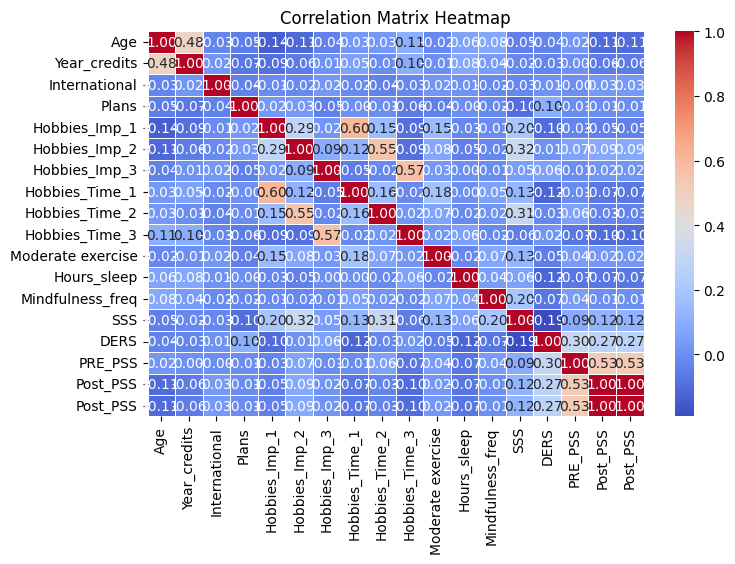

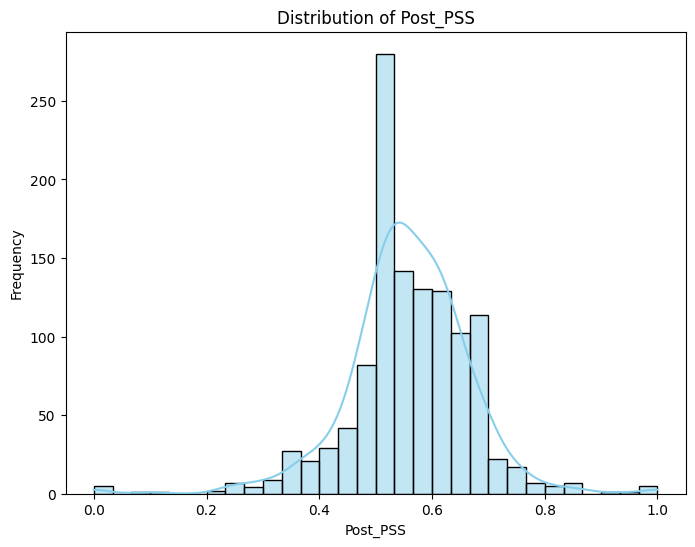

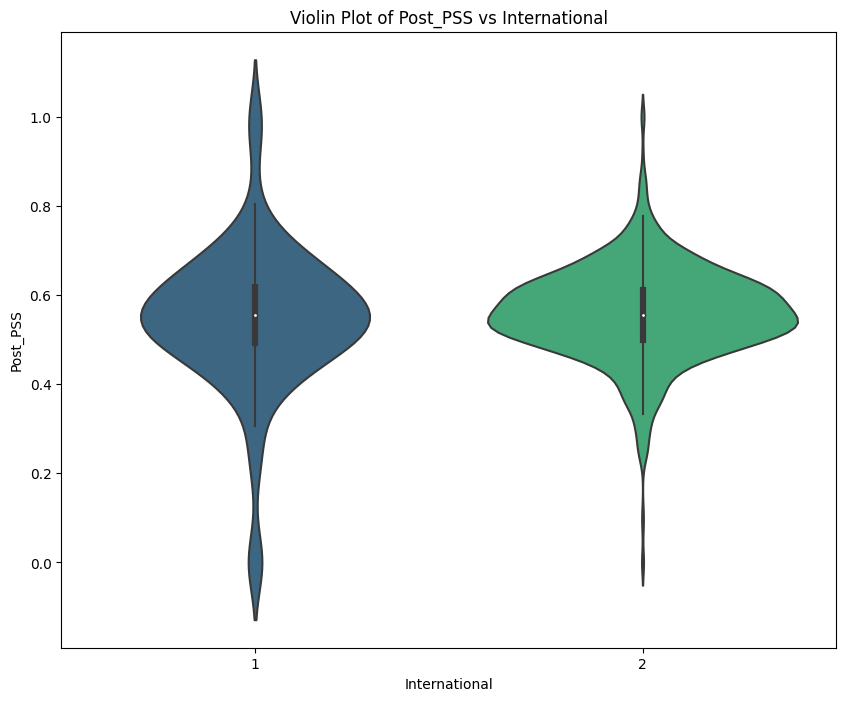

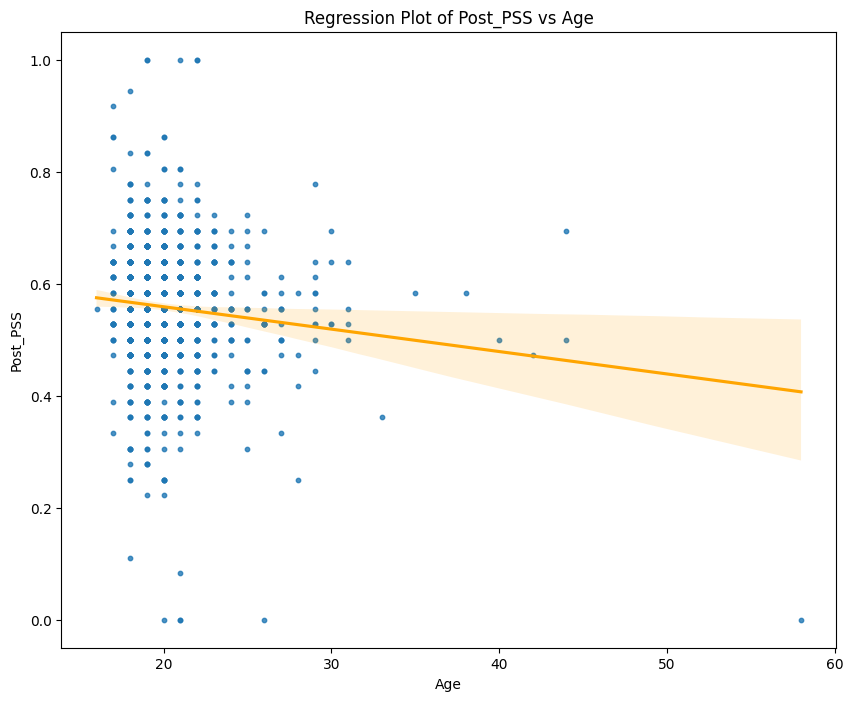

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize correlation matrix as a heatmap
correlation_matrix = df[features + [target]].corr()
plt.figure(figsize=(10, 5))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

# Visualize the distribution of the target variable
plt.figure(figsize=(8, 6))
sns.histplot(df[target], bins=30, kde=True, color='skyblue')
plt.title(f'Distribution of {target}')
plt.xlabel(target)
plt.ylabel('Frequency')
plt.show()

# Visualize the relationship between a categorical variable (e.g., International) and the target variable using a violin plot
plt.figure(figsize=(10, 8))
sns.violinplot(x=df['International'], y=df[target], palette='viridis')
plt.title(f'Violin Plot of {target} vs International')
plt.xlabel('International')
plt.ylabel(target)
plt.show()

# Visualize the relationship between a numerical variable (e.g., Age) and the target variable using a scatter plot with regression line
plt.figure(figsize=(10, 8))
sns.regplot(x=df['Age'], y=df[target], scatter_kws={'s': 10}, line_kws={'color': 'orange'})
plt.title(f'Regression Plot of {target} vs Age')
plt.xlabel('Age')
plt.ylabel(target)
plt.show()


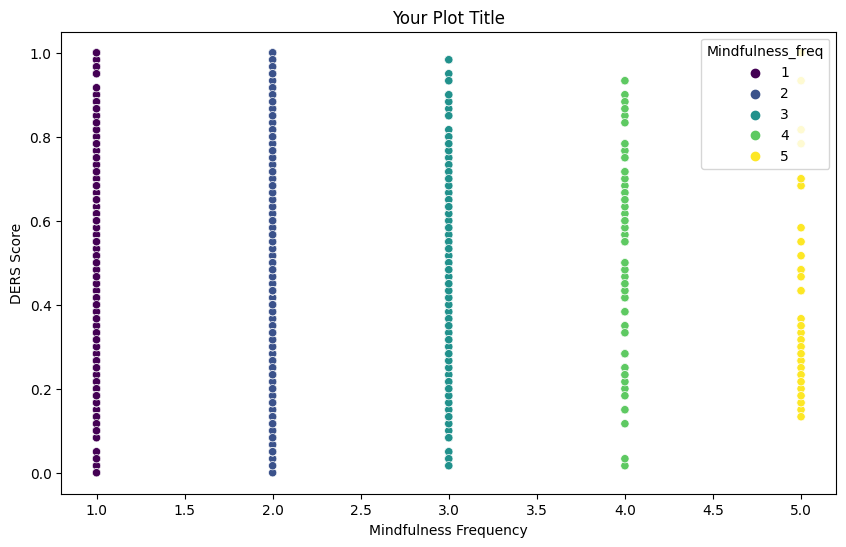

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
sns.scatterplot(x='Mindfulness_freq', y='', data=df, hue='Mindfulness_freq', palette='viridis')
plt.title('Your Plot Title')
plt.xlabel('Mindfulness Frequency')
plt.ylabel('DERS Score')
plt.show()


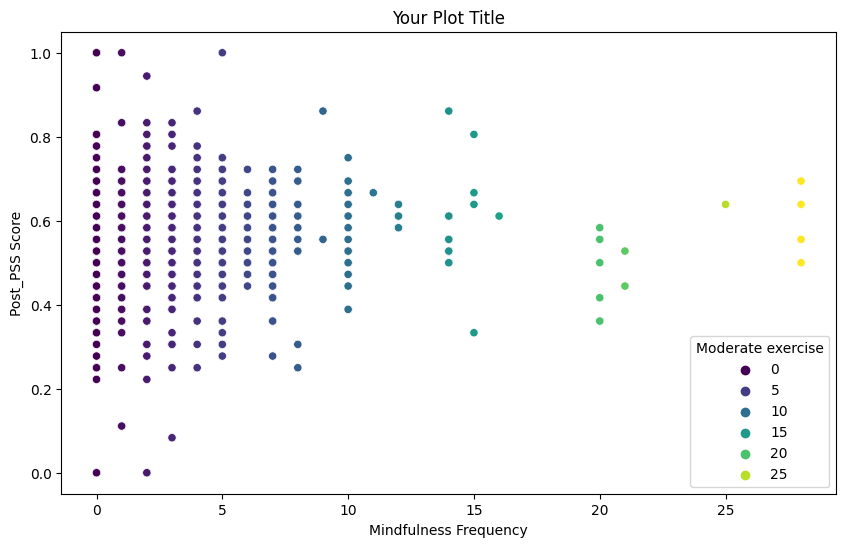

In [ ]:


plt.figure(figsize=(10, 6))
sns.scatterplot(x='Moderate exercise', y='Post_PSS', data=df, hue='Moderate exercise', palette='viridis')
plt.title('Your Plot Title')
plt.xlabel('Mindfulness Frequency')
plt.ylabel('Post_PSS Score')
plt.show()


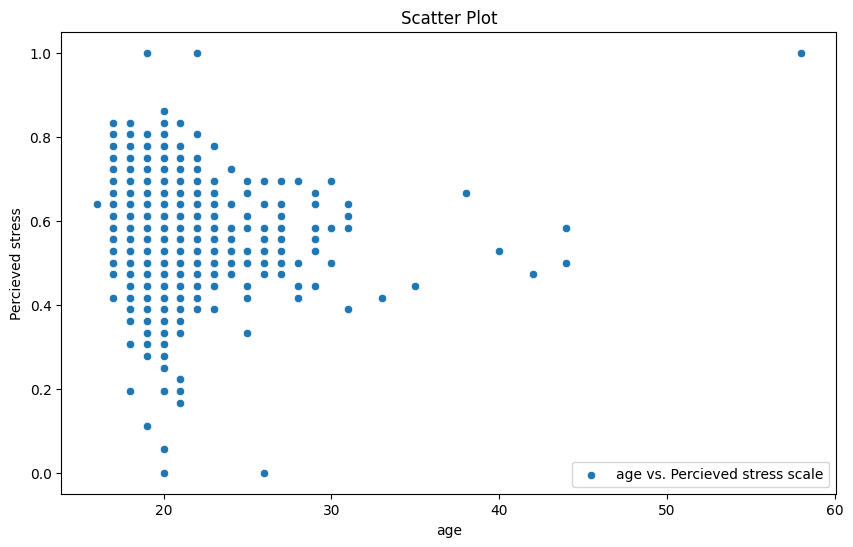

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns



# Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Age', y='PRE_PSS', data=df, label='age vs. Percieved stress scale')

plt.title('Scatter Plot')
plt.xlabel('age')
plt.ylabel('Percieved stress')
plt.legend()
plt.show()





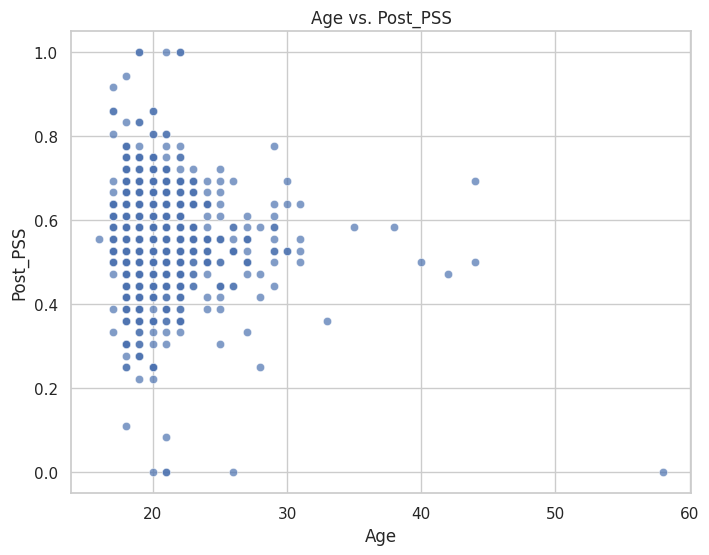

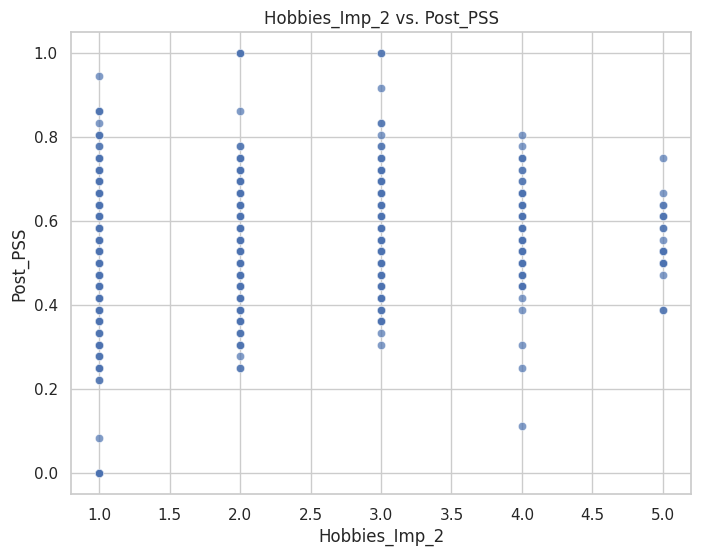

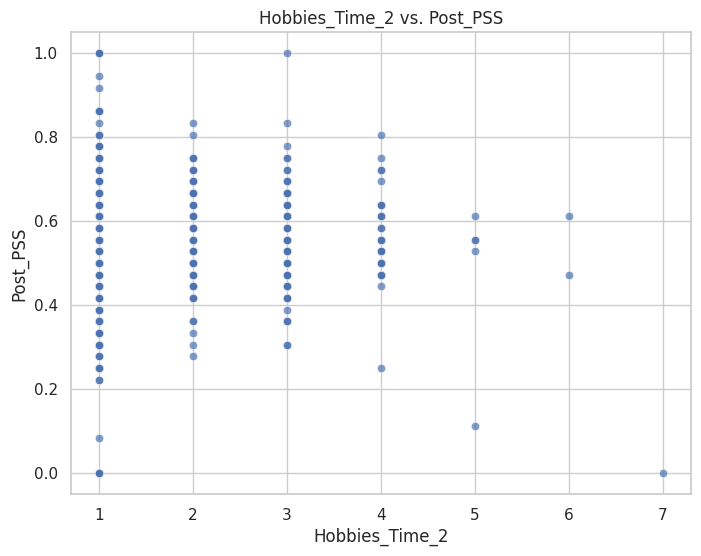

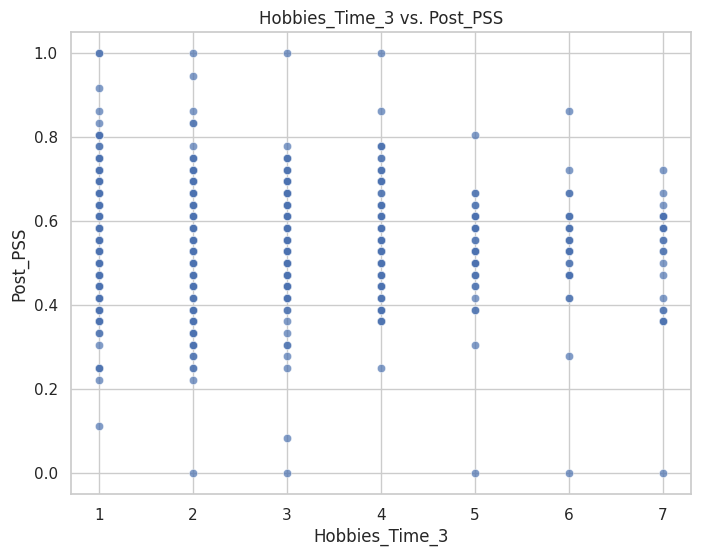

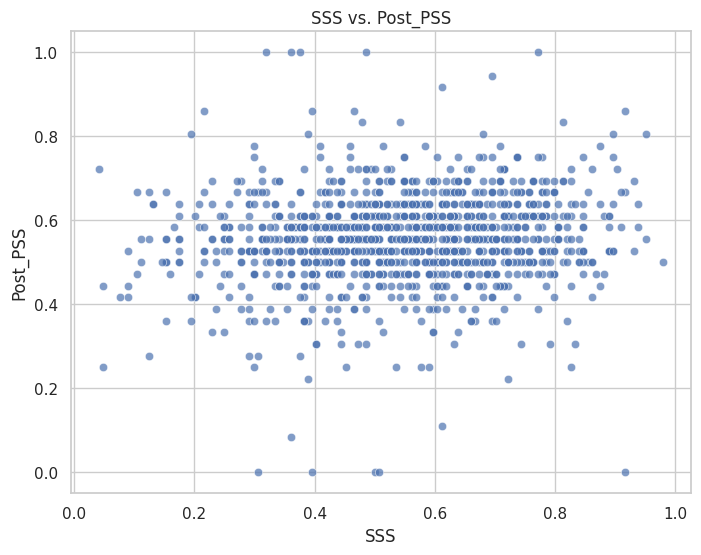

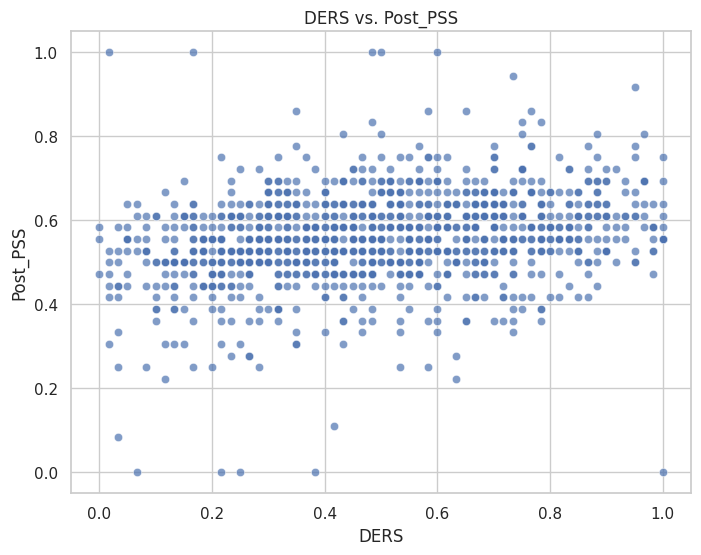

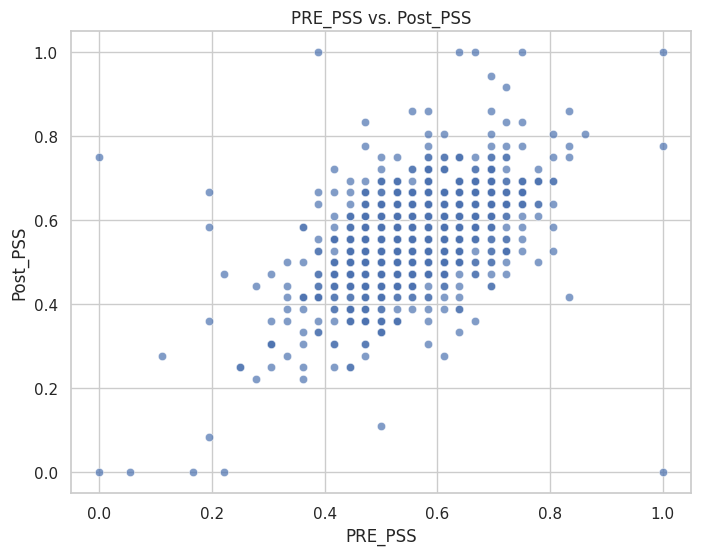

In [ ]:


# Assuming df is your DataFrame

# List of predictor variables
predictor_vars = ['Age', 'Hobbies_Imp_2', 'Hobbies_Time_2', 'Hobbies_Time_3', 'SSS', 'DERS', 'PRE_PSS']

# Set the style for the plots (optional)
sns.set(style="whitegrid")

# Create individual plots for each predictor variable
for var in predictor_vars:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=var, y='Post_PSS', data=df, alpha=0.7)
    plt.title(f'{var} vs. Post_PSS')
    plt.xlabel(var)
    plt.ylabel('Post_PSS')
    plt.show()


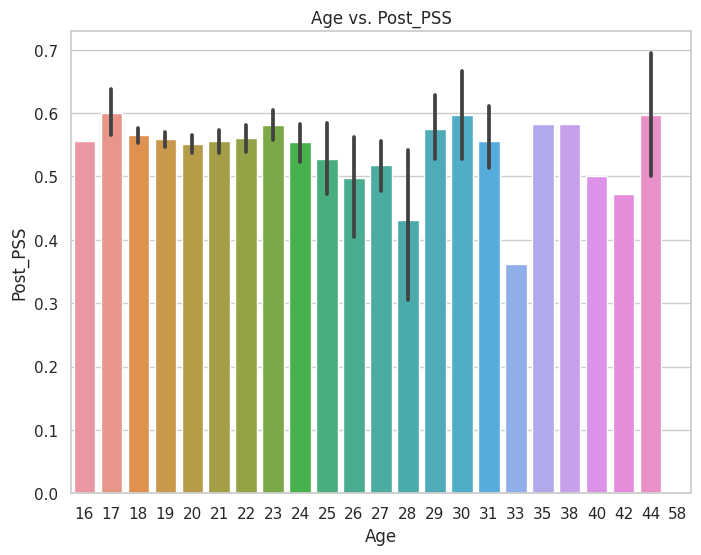

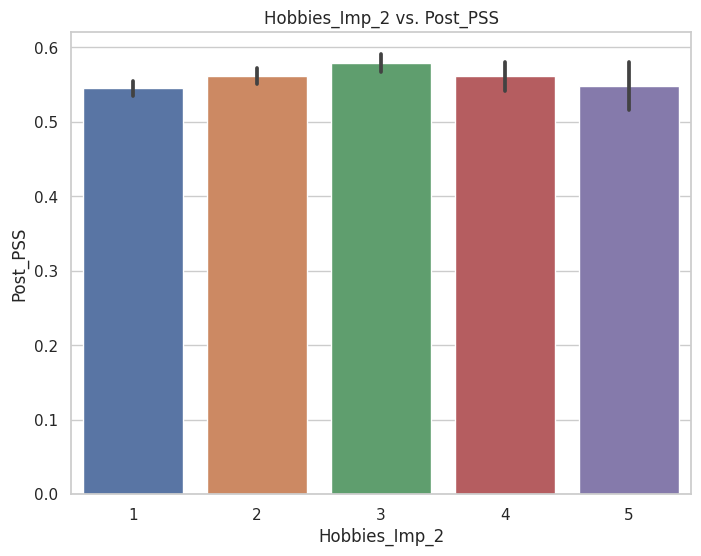

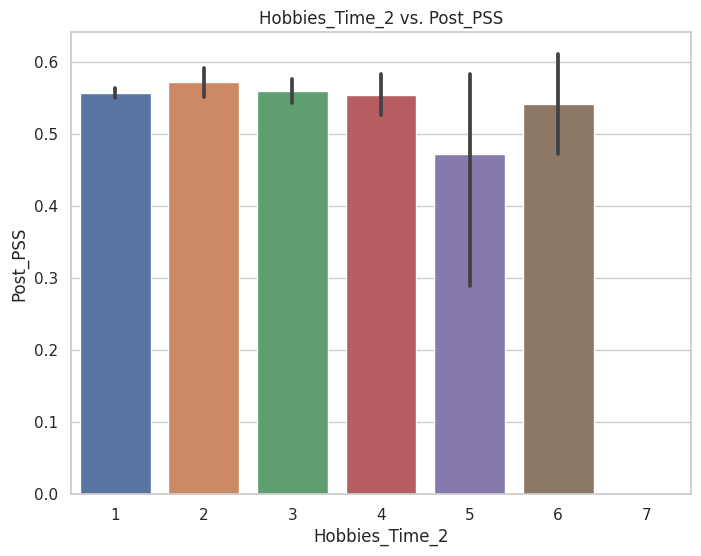

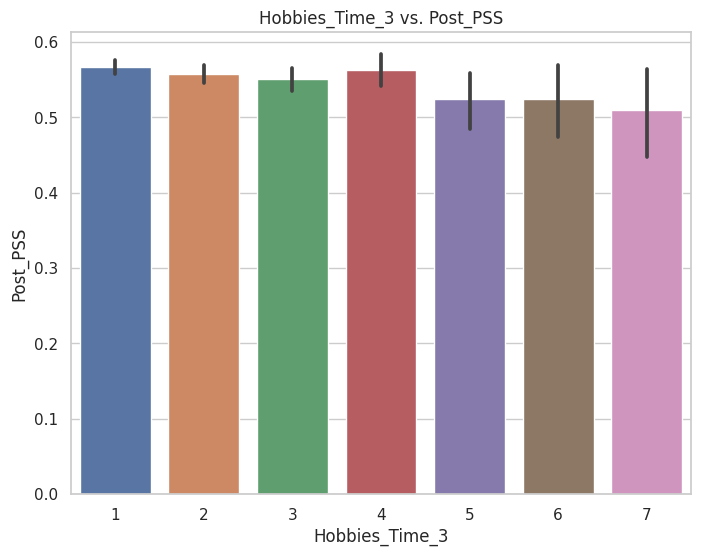

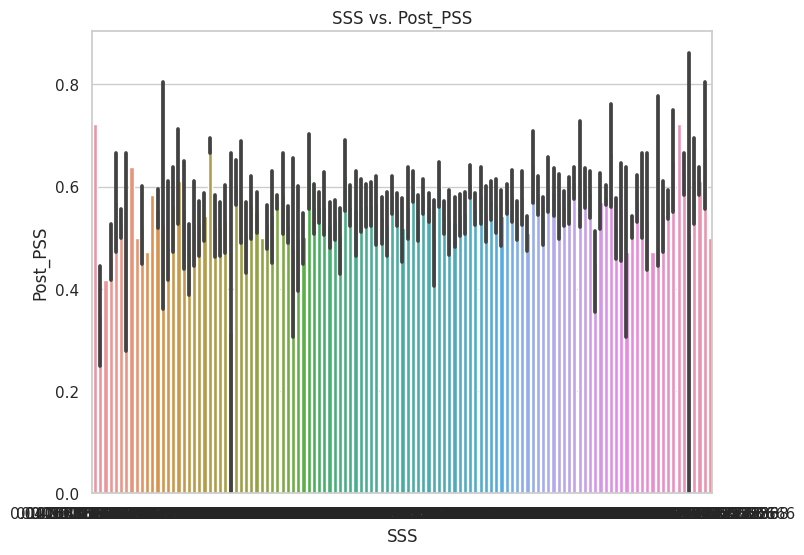

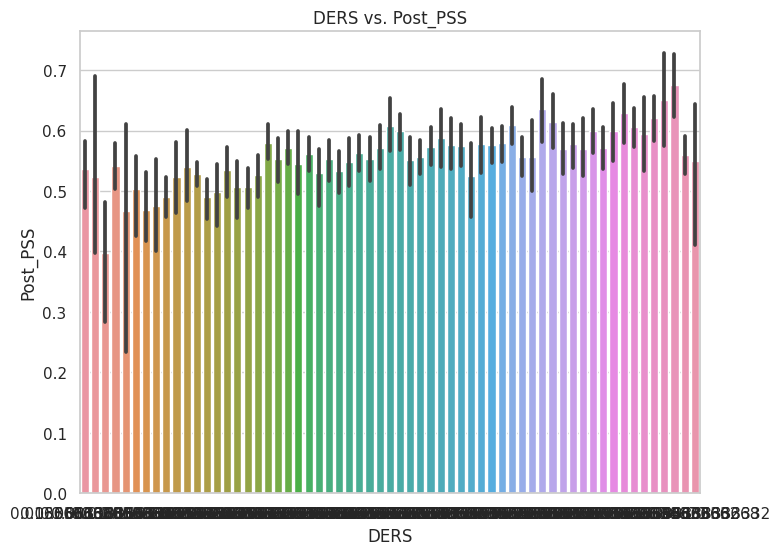

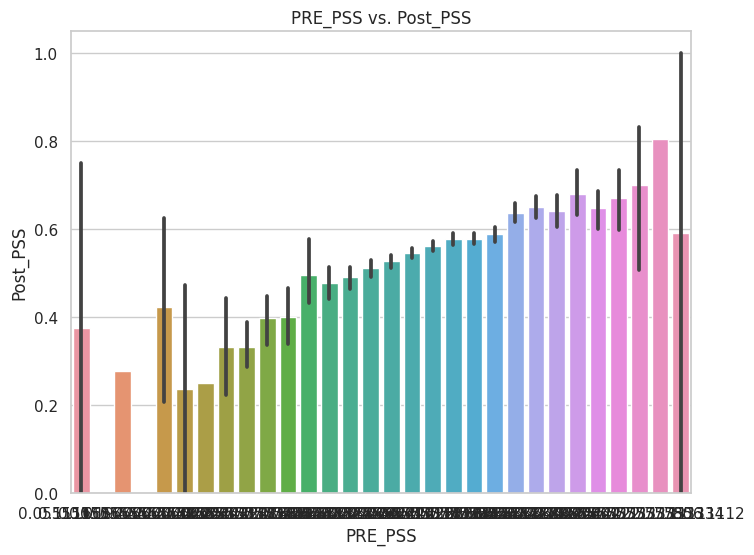

In [ ]:
for var in predictor_vars:
    plt.figure(figsize=(8, 6))
    sns.barplot(x=var, y='Post_PSS', data=df)
    plt.title(f'{var} vs. Post_PSS')
    plt.xlabel(var)
    plt.ylabel('Post_PSS')
    plt.show()


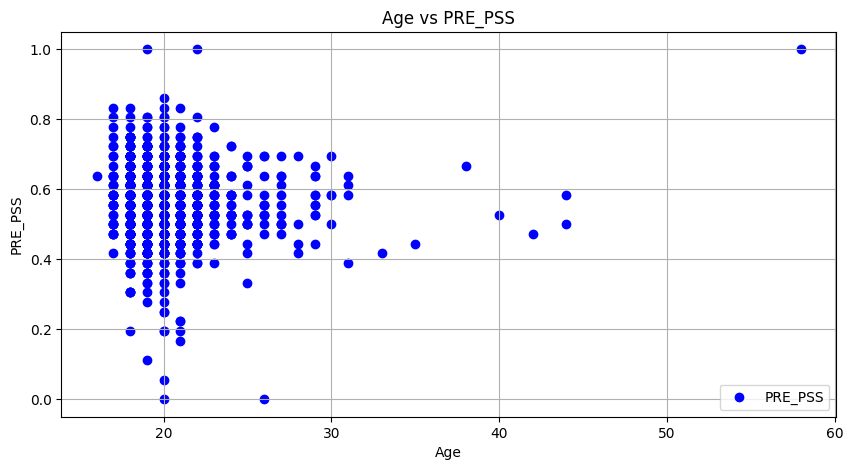

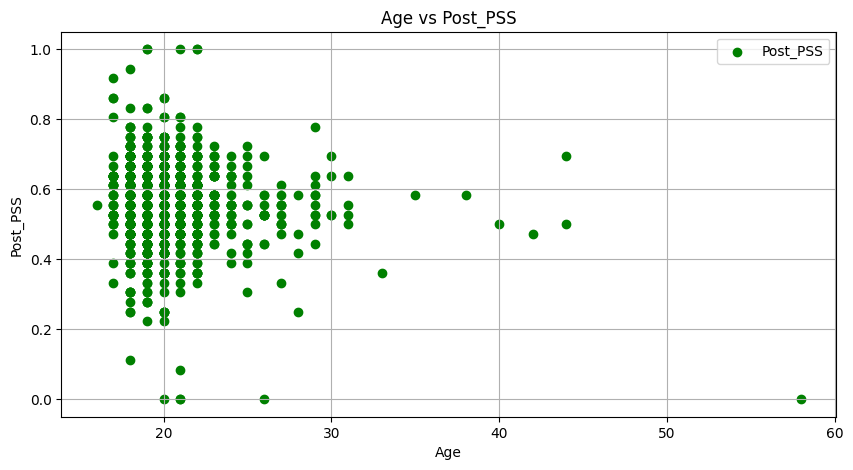

In [ ]:




import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have a DataFrame 'df' with 'Age', 'PRE_PSS', and 'Post_PSS' columns
# If your DataFrame has different column names, replace them accordingly

# Sort the DataFrame by 'Age' for better visualization
df = df.sort_values(by='PRE_PSS')

# Plotting Age vs PRE_PSS
plt.figure(figsize=(10, 6))
plt.plot(df['PRE_PSS'], df['Age'], label='Age', marker='o', linestyle='-', color='blue')
df = df.sort_values(by='Post_PSS')
# Plotting Age vs Post_PSS
plt.plot(df['Post_PSS'], df['Age'], label='Age', marker='o', linestyle='-', color='green')

# Adding labels and title
plt.xlabel('P')
plt.ylabel('PSS Scores')
plt.title('Age vs PSS Scores')
plt.legend()

# Display the plot
plt.show()



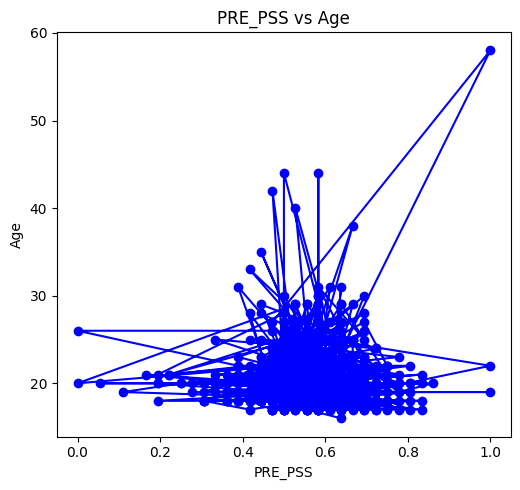

In [ ]:


# Plotting
plt.figure(figsize=(10, 5))

# Line chart for PRE_PSS vs Age
plt.subplot(1, 2, 1)
plt.plot(df['PRE_PSS'], df['Age'], marker='o', linestyle='-', color='b')
plt.title('PRE_PSS vs Age')
plt.xlabel('PRE_PSS')
plt.ylabel('Age')


plt.tight_layout()
plt.show()

Text(0, 0.5, 'Age')

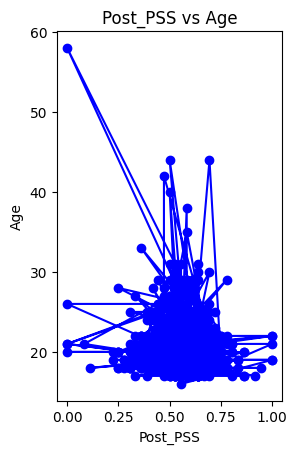

In [ ]:

# Line chart for PRE_PSS vs Age
plt.subplot(1, 2, 1)
plt.plot(df['Post_PSS'], df['Age'], marker='o', linestyle='-', color='b')
plt.title('Post_PSS vs Age')
plt.xlabel('Post_PSS')
plt.ylabel('Age')

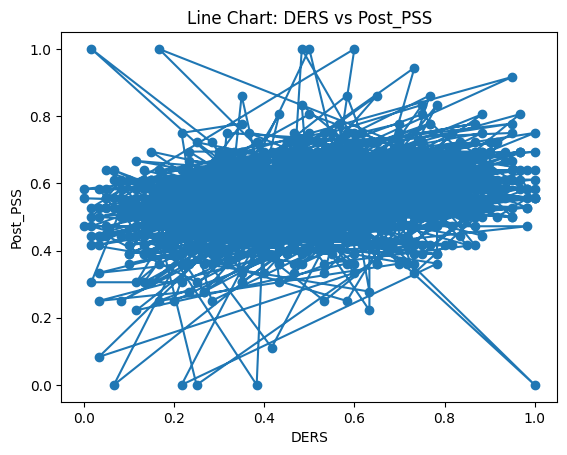

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming your data is in a DataFrame named 'df'
# If your data is in a CSV file, you can read it using: df = pd.read_csv('your_data.csv')

# Assuming 'DERS' and 'Post_PSS' are columns in your DataFrame
x_values = df['DERS']
y_values = df['Post_PSS']

# Create a line chart
plt.plot(x_values, y_values, marker='o', linestyle='-')

# Set labels and title
plt.xlabel('DERS')
plt.ylabel('Post_PSS')
plt.title('Line Chart: DERS vs Post_PSS')

# Show the plot
plt.show()
